## Percobaan 1

Resize dan Grayscale

In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns

Kode tersebut menyiapkan semua library yang dibutuhkan untuk klasifikasi citra, mulai dari pemrosesan gambar, ekstraksi fitur, hingga evaluasi model menggunakan algoritma seperti Random Forest, SVM, dan KNN.

## Data Loading

In [2]:
data = []
labels = []
file_name = []

for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = cv.imread(img_path)
        if img is not None:
            img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)  # Konversi ke grayscale
            img = cv.resize(img, (150, 150))           # Resize ke ukuran tetap
            img = img.astype(np.uint8)                 # Tipe data sesuai

            data.append(img)
            labels.append(sub_folder)
            file_name.append(filename)

data = np.array(data)
labels = np.array(labels)


Potongan kode diatas tersebut berfungsi untuk membaca dan menyiapkan data citra dari folder `dataset\\` guna digunakan dalam proses klasifikasi. Setiap subfolder di dalam direktori `dataset\\` diasumsikan sebagai label kelas, dan berisi gambar-gambar yang termasuk dalam kelas tersebut. Setiap gambar dibaca menggunakan OpenCV (`cv.imread`), dikonversi ke format grayscale agar lebih sederhana dan efisien untuk analisis, lalu di-*resize* ke ukuran 150x150 piksel agar semua citra memiliki dimensi yang seragam. Data citra yang telah diproses dimasukkan ke dalam list `data`, label kelasnya ke `labels`, dan nama file disimpan di `file_name`. Setelah seluruh gambar selesai diproses, list `data` dan `labels` dikonversi menjadi array NumPy untuk memudahkan pemrosesan selanjutnya menggunakan pustaka machine learning.


## Data Preparation

### Tanpa Preprocessing

Potongan kode dibawah ini digunakan untuk menampilkan visualisasi sampel citra dari setiap kelas (label) dalam dataset tanpa melakukan preprocessing tambahan. Pertama, `unique_labels` berisi daftar label unik yang diurutkan. Untuk setiap label, program mencari indeks gambar-gambar yang termasuk ke dalam label tersebut (`idxs`). Kemudian ditentukan maksimum 84 gambar untuk ditampilkan (jika jumlah gambar lebih dari 84, hanya 84 yang dipakai). Gambar-gambar ini ditampilkan dalam grid berukuran 7 baris × 12 kolom menggunakan `matplotlib`, dengan masing-masing subplot menampilkan satu gambar dalam skala abu-abu (grayscale). Judul pada setiap grid menunjukkan label kelas, dan semua sumbu subplot disembunyikan agar fokus hanya pada citranya. Ini sangat berguna untuk eksplorasi awal dan verifikasi apakah data sudah terbaca dengan benar.

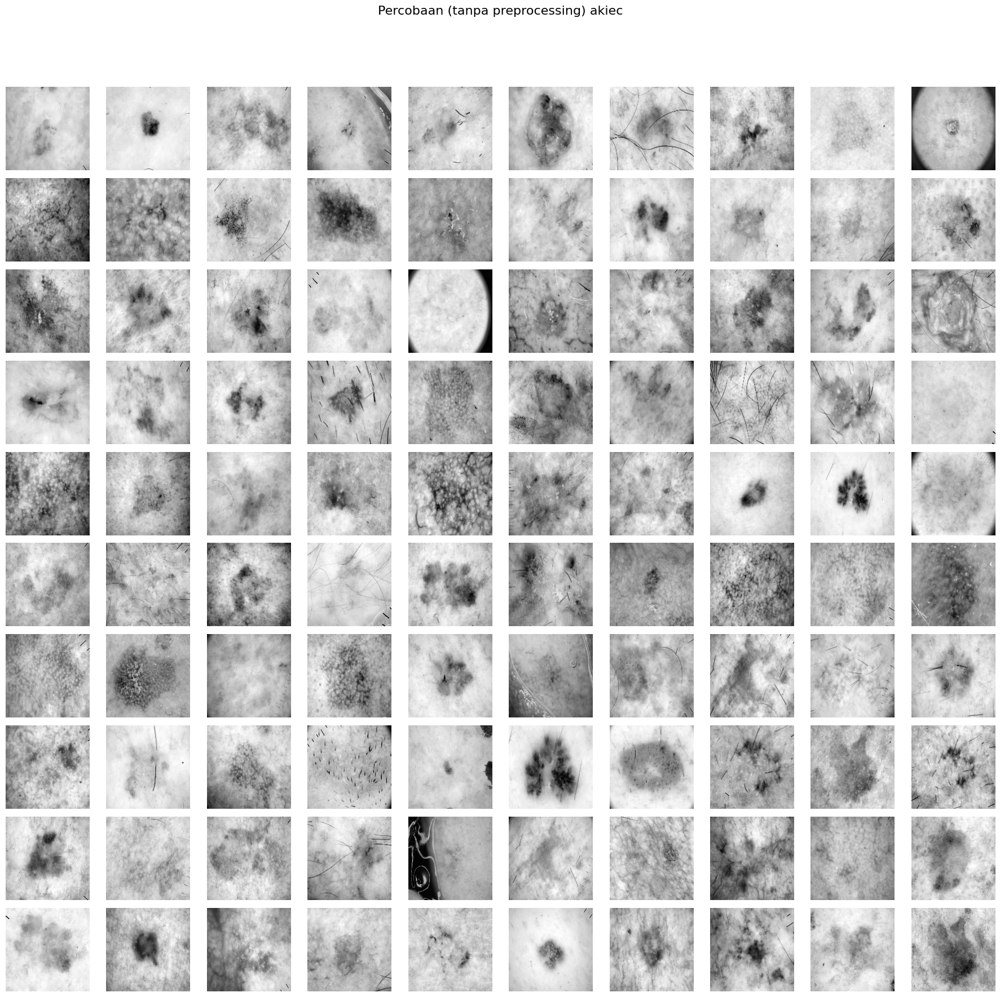

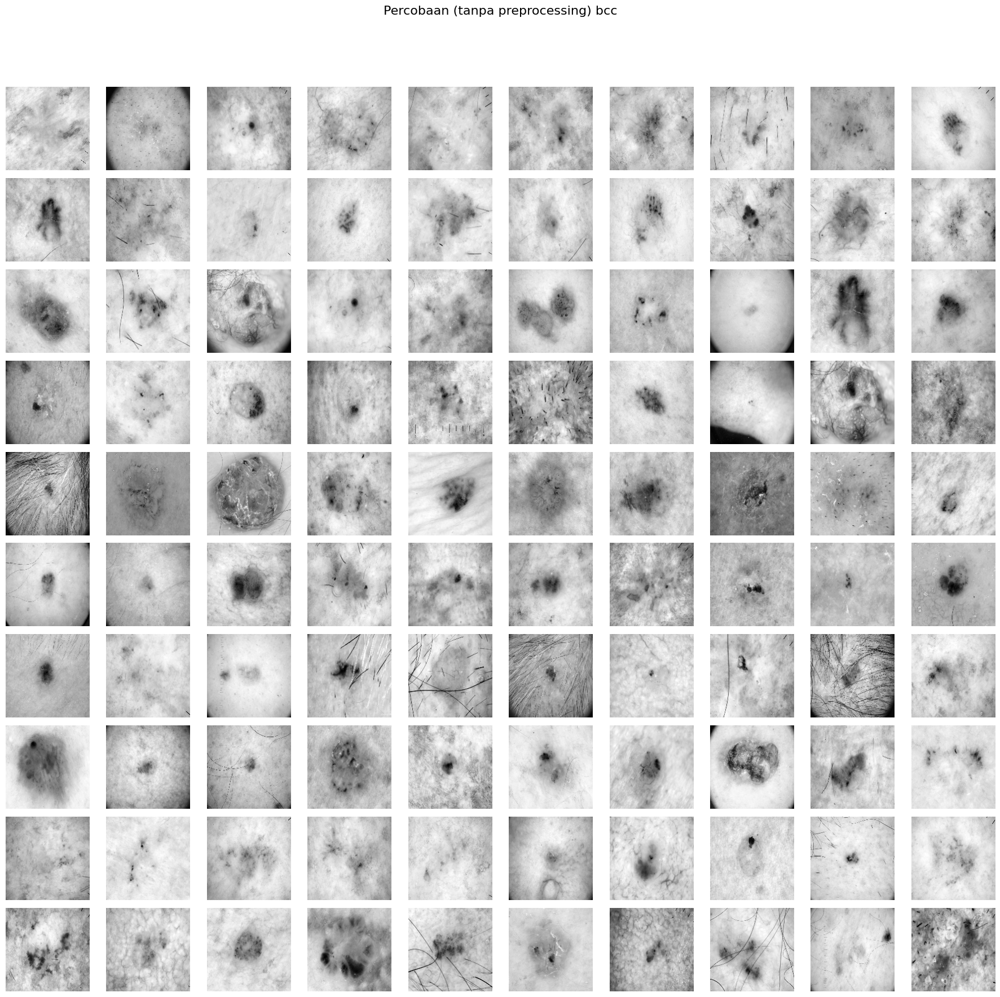

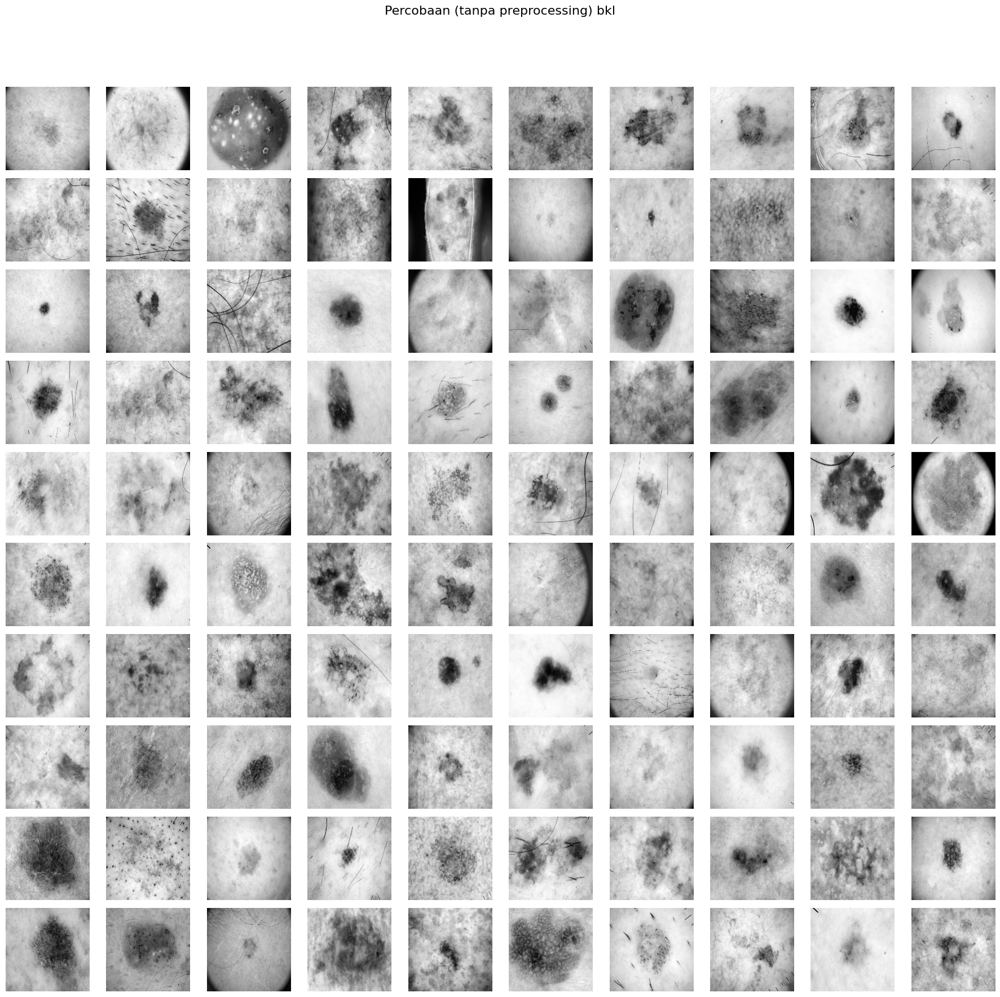

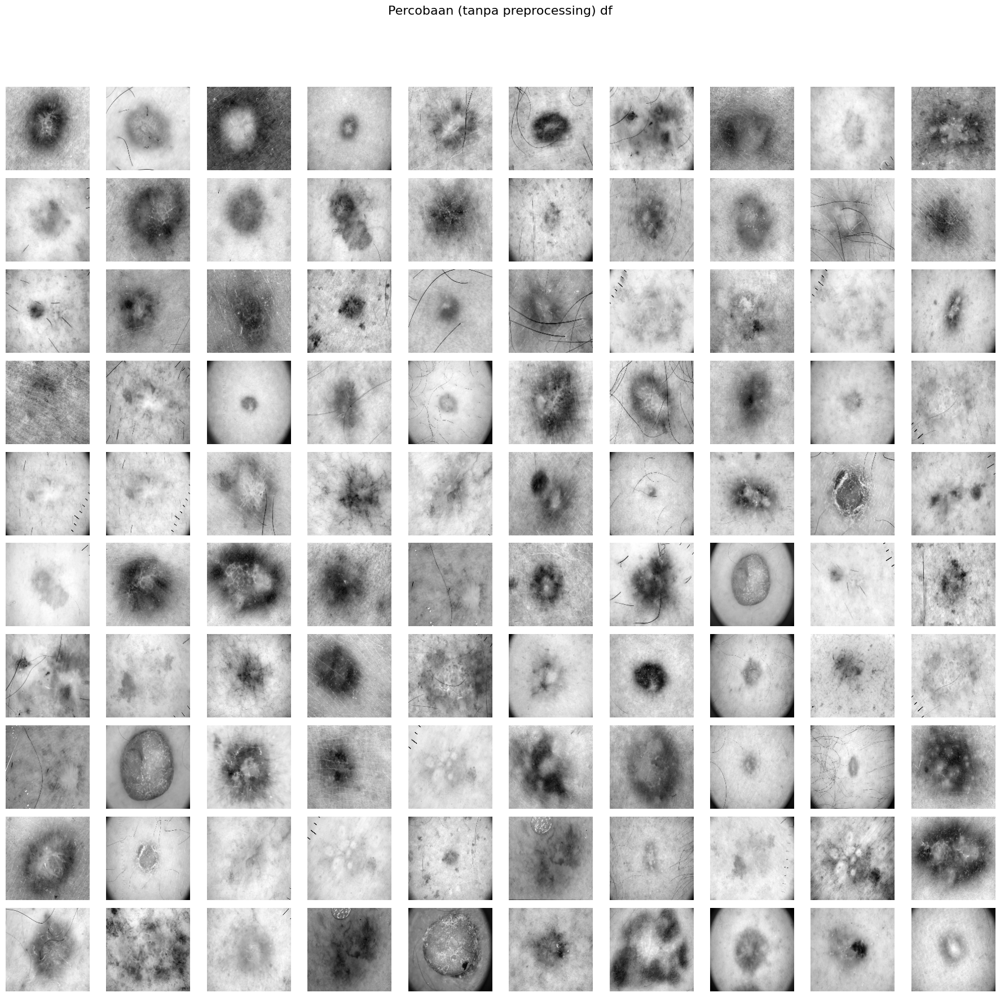

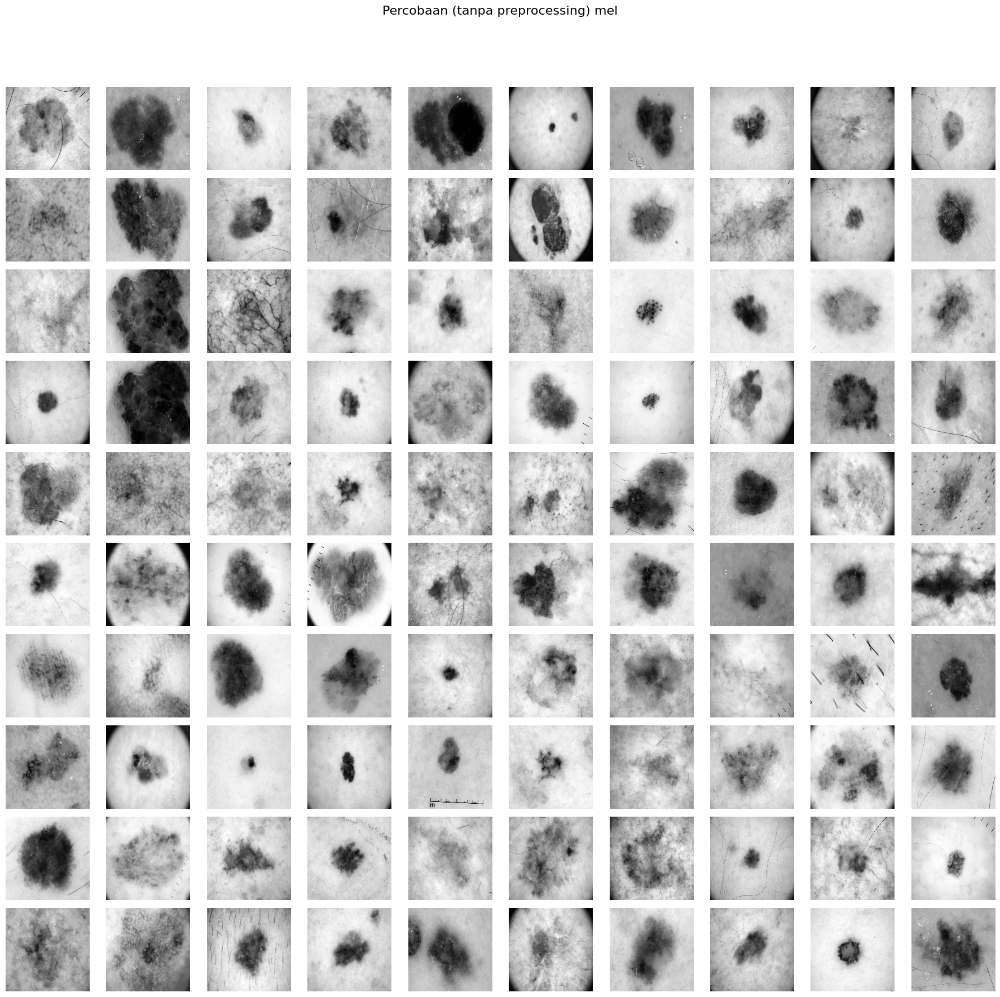

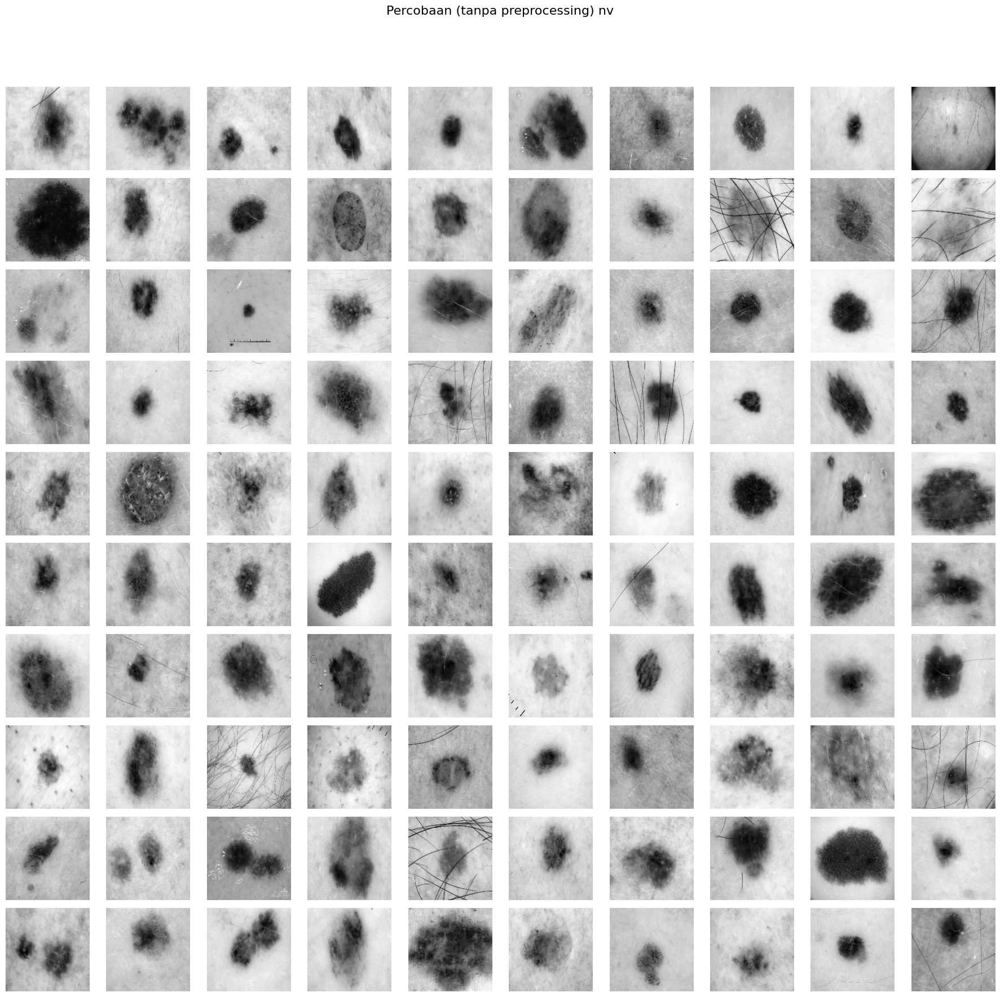

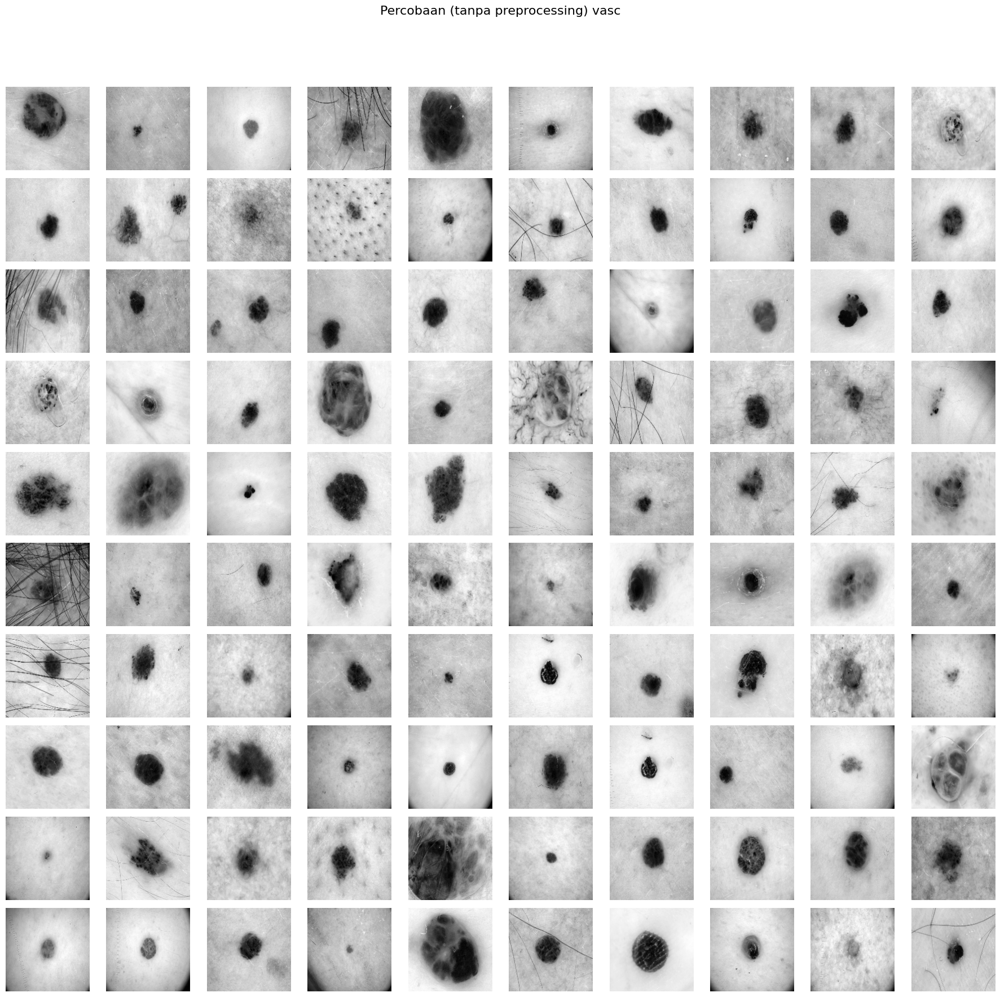

In [4]:
unique_labels = sorted(set(labels))

for label in unique_labels:
    idxs = [j for j, l in enumerate(labels) if l == label]
    n_imgs = min(100, len(idxs))
    fig, axs = plt.subplots(10, 10, figsize=(18, 18))
    fig.suptitle(f'Percobaan (tanpa preprocessing) {label}', fontsize=16)

    for k in range(100):
        row = k // 10
        col = k % 10
        ax = axs[row][col]
        if k < n_imgs:
            ax.imshow(data[idxs[k]], cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()


## Ekstrasi Fitur

In [5]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    
    return glcm

Fungsi `glcm(image, derajat)` digunakan untuk menghasilkan *Gray-Level Co-occurrence Matrix* (GLCM) dari citra grayscale berdasarkan arah tertentu, yaitu 0°, 45°, 90°, atau 135°. Derajat yang diberikan dikonversi ke radian agar sesuai dengan parameter `angles` pada fungsi `graycomatrix` dari `skimage.feature`. Fungsi ini menghitung hubungan antar piksel dengan jarak 1 piksel, menggunakan 256 level intensitas (grayscale), serta dengan opsi simetris dan ternormalisasi. Output dari fungsi ini berupa matriks GLCM yang nantinya dapat digunakan untuk mengekstrak fitur tekstur seperti kontras, homogenitas, energi, dan korelasi dari citra.

In [6]:
def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]

def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

def entropyGlcm(matriks):
    return entropy(matriks.ravel())

Kumpulan fungsi di atas digunakan untuk mengekstraksi berbagai fitur tekstur dari matriks GLCM yang telah dihitung sebelumnya. Setiap fungsi menerima parameter `matriks`, yaitu GLCM, dan mengembalikan nilai numerik dari properti tekstur tertentu menggunakan fungsi `graycoprops` dari pustaka `skimage.feature`. Fitur-fitur tersebut meliputi: 
1. Correlation (hubungan antara piksel dan tetangganya)
2. Dissimilarity (perbedaan nilai intensitas)
3. Homogeneity (keseragaman), contrast (kontras lokal)
4. ASM (Angular Second Moment atau keseragaman energi)
5. Energy (akar kuadrat dari ASM)

Selain itu, fungsi `entropyGlcm` menghitung tingkat kompleksitas informasi dalam GLCM menggunakan fungsi `entropy` dari `scipy.stats`. Fitur-fitur ini sangat penting dalam analisis tekstur citra untuk keperluan klasifikasi atau segmentasi.


Potongan kode dibawah ini berfungsi untuk mengekstraksi fitur tekstur dari kumpulan citra grayscale menggunakan metode GLCM (Gray-Level Co-occurrence Matrix) dengan arah 0 derajat. Fungsi `ekstrak_fitur_glcm(data, nama_prepro)` akan memproses setiap citra dalam list `data`, mengubahnya menjadi `uint8`, lalu menghitung GLCM-nya menggunakan fungsi `glcm(img_u8, 0)`. Dari GLCM tersebut, berbagai fitur tekstur seperti contrast, correlation, energy, homogeneity, dissimilarity, ASM, dan entropy diambil dan disimpan dalam bentuk dictionary. Seluruh fitur dari semua citra dikumpulkan ke dalam list, yang kemudian dikonversi menjadi DataFrame `df1` menggunakan pandas. Kolom tambahan `tahap` berisi nama proses atau tahap preprocessing (dalam hal ini `'percobaan1'`) untuk menandai asal fitur. Fungsi ini berguna untuk membentuk dataset fitur yang siap digunakan dalam analisis atau klasifikasi.


In [7]:
# Fungsi ekstraksi fitur untuk list citra
def ekstrak_fitur_glcm(data, nama_prepro):
    fitur_list = []
    for img in data:
        img_u8 = img.astype(np.uint8)
        m = glcm(img_u8, 0)  # derajat 0
        
        fitur = {
            'contrast': contrast(m),
            'correlation': correlation(m),
            'energy': energy(m),
            'homogeneity': homogenity(m),
            'dissimilarity': dissimilarity(m),
            'ASM': ASM(m),
            'entropy': entropyGlcm(m)
        }
        fitur_list.append(fitur)

    df = pd.DataFrame(fitur_list)
    df['tahap'] = nama_prepro
    return df

df1 = ekstrak_fitur_glcm(data, 'percobaan1')
display(df1)

,contrast,correlation,energy,homogeneity,dissimilarity,ASM,entropy,tahap
0,30.999508,0.953867,0.038948,0.309507,3.146532,0.001517,6.914421,percobaan1
1,21.015570,0.979958,0.068314,0.379623,2.598389,0.004667,6.002717,percobaan1
2,33.485235,0.946196,0.034684,0.254550,3.885235,0.001203,7.139483,percobaan1
3,58.765593,0.955062,0.034024,0.284454,3.940626,0.001158,7.276851,percobaan1
4,26.013647,0.881256,0.060002,0.337046,2.833691,0.003600,6.177974,percobaan1
...,...,...,...,...,...,...,...,...
1252,25.156779,0.984671,0.051061,0.301863,3.232036,0.002607,6.581586,percobaan1
1253,43.772483,0.989610,0.038636,0.304124,3.747069,0.001493,7.178757,percobaan1
1254,6.925011,0.991402,0.073053,0.441750,1.777987,0.005337,5.879207,percobaan1
1255,61.303669,0.985296,0.035512,0.266409,4.250515,0.001261,7.220225,percobaan1


In [8]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(data)):
    D0 = glcm(data[i], 0)
    D45 = glcm(data[i], 45)
    D90 = glcm(data[i], 90)
    D135 = glcm(data[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)

Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []

for i in range(len(data)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)

for i in range(len(data)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)

for i in range(len(data)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)

for i in range(len(data)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)

for i in range(len(data)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)

for i in range(len(data)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)

for i in range(len(data)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)



Potongan kode diatas melakukan ekstraksi fitur tekstur dari seluruh citra dalam dataset berdasarkan Gray-Level Co-occurrence Matrix (GLCM) dengan empat arah berbeda: 0°, 45°, 90°, dan 135°. Pertama, GLCM dihitung untuk setiap citra dan setiap derajat, lalu disimpan ke dalam list (`Derajat0`, `Derajat45`, dll.). Setelah itu, untuk setiap GLCM yang telah dihitung, diambil fitur-fitur tekstur seperti correlation, contrast, dissimilarity, homogeneity, entropy, ASM, dan energy dari masing-masing arah, dan hasilnya disimpan ke dalam list khusus per fitur dan arah (misalnya `Kontras0`, `Kontras45`, dll.). Tujuan akhir dari proses ini adalah membentuk kumpulan fitur lengkap yang mempertimbangkan arah tekstur, yang kemudian dapat digunakan sebagai input ke model machine learning untuk klasifikasi atau analisis lanjutan. Meskipun kode ini cukup panjang dan repetitif, ia bekerja sistematis untuk memastikan semua fitur tekstur dari setiap arah dihitung dengan lengkap.


## Hasil Ekstraksi to CSV

In [9]:
features = []

for i in range(len(data)):
    fitur = [
        contrast(Derajat0[i]), contrast(Derajat45[i]), contrast(Derajat90[i]), contrast(Derajat135[i]),
        dissimilarity(Derajat0[i]), dissimilarity(Derajat45[i]), dissimilarity(Derajat90[i]), dissimilarity(Derajat135[i]),
        homogenity(Derajat0[i]), homogenity(Derajat45[i]), homogenity(Derajat90[i]), homogenity(Derajat135[i]),
        entropyGlcm(Derajat0[i]), entropyGlcm(Derajat45[i]), entropyGlcm(Derajat90[i]), entropyGlcm(Derajat135[i]),
        ASM(Derajat0[i]), ASM(Derajat45[i]), ASM(Derajat90[i]), ASM(Derajat135[i]),
        energy(Derajat0[i]), energy(Derajat45[i]), energy(Derajat90[i]), energy(Derajat135[i]),
        correlation(Derajat0[i]), correlation(Derajat45[i]), correlation(Derajat90[i]), correlation(Derajat135[i]),
    ]
    features.append(fitur)

# Buat dataframe
columns = [
    "contrast_0", "contrast_45", "contrast_90", "contrast_135",
    "dissimilarity_0", "dissimilarity_45", "dissimilarity_90", "dissimilarity_135",
    "homogeneity_0", "homogeneity_45", "homogeneity_90", "homogeneity_135",
    "entropy_0", "entropy_45", "entropy_90", "entropy_135",
    "ASM_0", "ASM_45", "ASM_90", "ASM_135",
    "energy_0", "energy_45", "energy_90", "energy_135",
    "correlation_0", "correlation_45", "correlation_90", "correlation_135"
]

df_fitur = pd.DataFrame(features, columns=columns)


Potongan kode diatas menyusun semua fitur tekstur dari citra-citra dalam dataset menjadi sebuah dataframe yang siap digunakan untuk analisis atau pelatihan model klasifikasi. Untuk setiap citra, fitur tekstur dihitung dari matriks GLCM pada empat sudut berbeda (0°, 45°, 90°, dan 135°), mencakup contrast, dissimilarity, homogeneity, entropy, ASM, energy, dan correlation. Semua nilai fitur tersebut dikumpulkan ke dalam sebuah list `fitur`, lalu ditambahkan ke list `features`. Setelah proses ini selesai untuk seluruh data, `features` dikonversi menjadi sebuah pandas DataFrame bernama `df_fitur`, dengan kolom-kolom yang diberi nama sesuai jenis fitur dan arah GLCM-nya. Struktur ini sangat penting untuk memastikan bahwa data siap digunakan sebagai input dalam proses pelatihan model machine learning seperti Random Forest, SVM, atau KNN.


Potongan kode dibawah ini menyusun seluruh fitur hasil ekstraksi tekstur dari citra ke dalam bentuk tabel data terstruktur (DataFrame) dan menyimpannya ke file CSV. Dictionary `dataTable` menggabungkan informasi nama file (`Filename`), label kelas (`Label`), serta semua fitur GLCM (seperti Contrast, Homogeneity, Dissimilarity, Entropy, ASM, Energy, dan Correlation) untuk keempat sudut (0°, 45°, 90°, dan 135°). Dictionary tersebut kemudian dikonversi menjadi DataFrame `df` menggunakan `pd.DataFrame()`. Selanjutnya, DataFrame tersebut disimpan ke file bernama `'hasil_ekstraksi_percobaan(tanpaPrepro).csv'` menggunakan `to_csv()` tanpa menyertakan index. Terakhir, file CSV tersebut dibaca ulang ke dalam variabel `hasilEkstrak` untuk ditampilkan kembali, memastikan proses penyimpanan dan pembacaan berhasil. Ini adalah tahap penting dalam pipeline ekstraksi fitur sebelum data digunakan untuk pelatihan model klasifikasi.


In [10]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_percobaan(tanpaPrepro).csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_percobaan(tanpaPrepro).csv')
hasilEkstrak


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,ISIC_0024329.jpg,akiec,30.999508,31.402685,22.369172,36.548984,0.309507,0.275700,0.341487,0.282330,...,0.001711,0.001359,0.038948,0.036481,0.041366,0.036867,0.953867,0.953164,0.966750,0.945489
1,ISIC_0024418.jpg,akiec,21.015570,34.678303,25.904609,33.885636,0.379623,0.339255,0.391598,0.365788,...,0.004835,0.004464,0.068314,0.063451,0.069537,0.066816,0.979958,0.967109,0.975294,0.967861
2,ISIC_0024463.jpg,akiec,33.485235,45.175172,26.589530,39.277420,0.254550,0.219889,0.275533,0.232476,...,0.001316,0.001077,0.034684,0.031838,0.036279,0.032824,0.946196,0.927475,0.957146,0.936944
3,ISIC_0024511.jpg,akiec,58.765593,47.676141,46.202550,92.442097,0.284454,0.274902,0.317846,0.245157,...,0.001299,0.000992,0.034024,0.033005,0.036035,0.031498,0.955062,0.963476,0.965117,0.929200
4,ISIC_0024522.jpg,akiec,26.013647,38.863610,33.281969,35.912526,0.337046,0.301744,0.362077,0.330606,...,0.003919,0.003542,0.060002,0.056352,0.062604,0.059511,0.881256,0.822277,0.848292,0.835736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252,ISIC_0033844.jpg,vasc,25.156779,32.145534,19.823714,33.236746,0.301863,0.277222,0.319422,0.270674,...,0.002768,0.002295,0.051061,0.048957,0.052616,0.047906,0.984671,0.980497,0.987936,0.979832
1253,ISIC_0033969.jpg,vasc,43.772483,55.116031,27.281432,60.858520,0.304124,0.287233,0.343555,0.271022,...,0.001678,0.001293,0.038636,0.037609,0.040962,0.035960,0.989610,0.986891,0.993571,0.985525
1254,ISIC_0033991.jpg,vasc,6.925011,9.701455,4.811230,8.797442,0.441750,0.406692,0.491672,0.419083,...,0.006101,0.004975,0.073053,0.069077,0.078112,0.070537,0.991402,0.988020,0.994026,0.989136
1255,ISIC_0034196.jpg,vasc,61.303669,90.237872,42.139150,73.211837,0.266409,0.242574,0.316062,0.241198,...,0.001564,0.001126,0.035512,0.033326,0.039547,0.033555,0.985296,0.978479,0.989908,0.982540


## Feature Selection

### Correlation

Potongan kode ini melakukan seleksi fitur berdasarkan korelasi antar fitur untuk mengurangi redundansi dalam data. Pertama, dihitung matriks korelasi (`correlation`) dari semua fitur numerik dengan menghapus kolom `Label` dan `Filename`. Kemudian, fitur-fitur yang memiliki korelasi sangat tinggi satu sama lain (≥ 0.95) dianggap redundant, dan salah satunya akan dihapus. Proses ini dilakukan dengan cara menandai fitur yang memiliki korelasi tinggi, lalu menyisakan hanya satu dari setiap pasangan fitur yang saling berkorelasi tinggi. Hasil fitur yang terseleksi disimpan dalam variabel `x_new`, dan label kelas tetap dipertahankan dalam `y`. Terakhir, korelasi antar fitur hasil seleksi divisualisasikan dalam bentuk heatmap menggunakan seaborn untuk melihat sejauh mana fitur-fitur terpilih saling berkorelasi. Teknik ini efektif untuk menyederhanakan model dan menghindari multikolinearitas dalam algoritma pembelajaran mesin.


<Axes: >

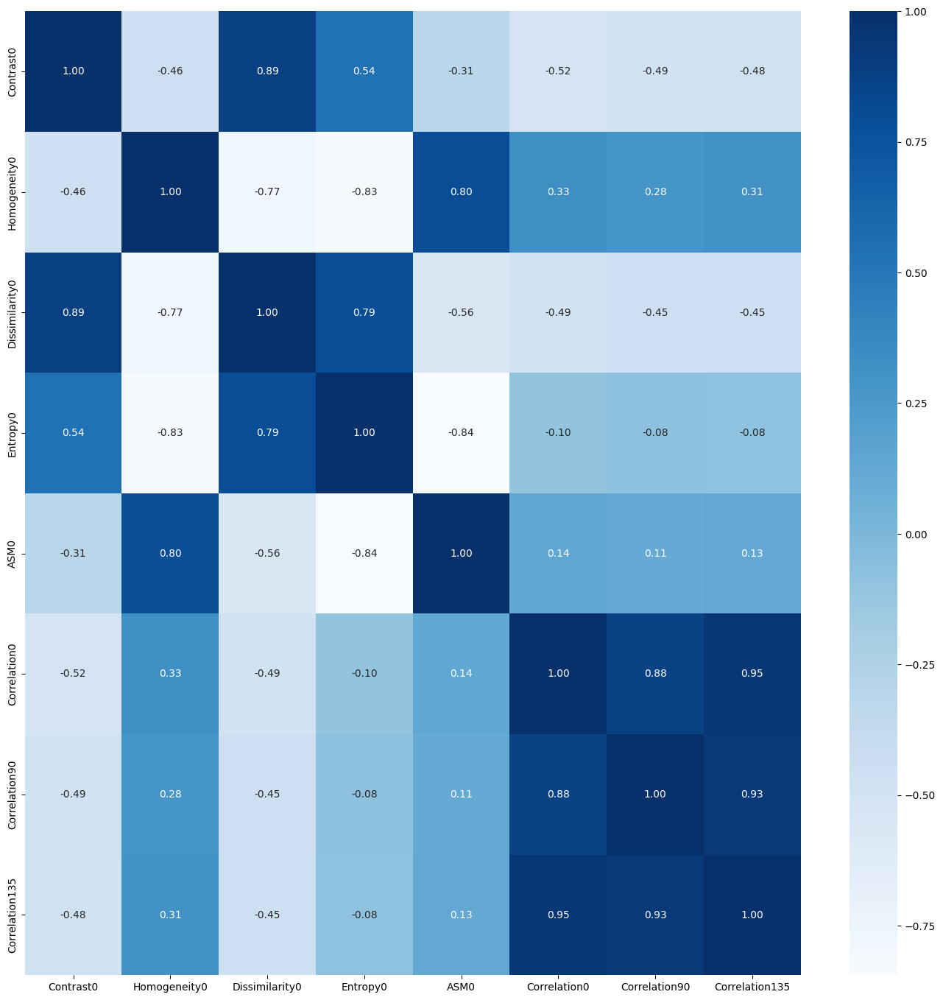

In [11]:
# Selection Correlation
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")

## Splitting Data

Kode dibawah ini digunakan untuk membagi data fitur (`x_new`) dan label (`y`) menjadi data latih dan data uji dengan menggunakan fungsi `train_test_split` dari pustaka `sklearn.model_selection`. Parameter `test_size=0.2` berarti 20% dari total data akan digunakan sebagai data uji, sementara 80% sisanya digunakan untuk melatih model. Parameter `random_state=42` menjaga hasil pembagian tetap konsisten setiap kali kode dijalankan. Hasil pembagian disimpan dalam variabel `X_train`, `X_test`, `y_train`, dan `y_test`, lalu bentuk (jumlah baris dan kolom) yang masing-masing ditampilkan dengan `print`.

In [12]:
# ubah bagian test_size sesuai kebutuhan
# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1005, 8)
(252, 8)
(1005,)
(252,)


## Feature Normalization

Kode dibawah ini melakukan normalisasi data dengan metode Z-Score (standardization) menggunakan rumus:

$$
X_{\text{norm}} = \frac{X - \mu}{\sigma}
$$

di mana:

 $\mu$ = rata-rata (mean) dari data pelatihan (`X_train.mean()`)
 
 $\sigma$ = standar deviasi dari data pelatihan (`X_train.std()`)

### Penjelasan Langkah:

1. `X_train` dinormalisasi menggunakan mean dan std dari `X_train` itu sendiri.
2. `X_test` juga dinormalisasi menggunakan mean dan std dari `X_train`, bukan dari `X_test`, karena saat menerapkan model ke data baru, kita harus menggunakan statistik dari data pelatihan agar tidak terjadi data leakage.

Tujuannya adalah agar semua fitur memiliki skala yang sama (rata-rata 0 dan standar deviasi 1), sehingga algoritma machine learning yang sensitif terhadap skala (seperti KNN, SVM, dan regresi logistik) dapat bekerja secara optimal.


In [13]:
# normalisasi mean std (Standardization / Z-score normalization)
X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

## Modeling

### Define Model

In [14]:
def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)

Pada tahap ini, dilakukan evaluasi performa tiga algoritma klasifikasi yaitu Random Forest, Support Vector Machine (SVM), dan K-Nearest Neighbors (KNN) terhadap data citra yang telah melalui proses ekstraksi fitur dan normalisasi. Masing-masing model dilatih menggunakan data latih (`X_train`, `y_train`) dan diuji pada data uji (`X_test`, `y_test`). Fungsi `generateClassificationReport` digunakan untuk menampilkan metrik evaluasi seperti classification report (precision, recall, dan f1-score), confusion matrix, serta akurasi untuk masing-masing model. Random Forest menggunakan lima estimator (pohon keputusan), SVM memakai kernel RBF untuk menangani data non-linear, dan KNN memanfaatkan lima tetangga terdekat untuk klasifikasi. Evaluasi ini bertujuan untuk mengetahui model mana yang paling baik dalam mengklasifikasikan label citra retina berdasarkan fitur tekstur yang dihasilkan dari metode GLCM.


### Train Random Forest Classifier

Pada kode dobawah ini, model Random Forest Classifier dilatih menggunakan data latih (`X_train`, `y_train`) dan kemudian dievaluasi baik pada data latih maupun data uji. Proses evaluasi dilakukan dua kali: pertama untuk melihat performa model saat mempelajari data (training set), dan kedua untuk menilai kemampuan generalisasi model terhadap data baru yang belum pernah dilihat (testing set). Setelah melakukan prediksi (`predict`) pada masing-masing dataset, fungsi `generateClassificationReport` digunakan untuk menampilkan metrik evaluasi seperti classification report, confusion matrix, dan accuracy. Hasil ini membantu dalam menilai apakah model mengalami overfitting (sangat bagus di data latih tapi buruk di data uji) atau sudah cukup seimbang dalam performanya.


In [15]:
# Train Random Forest Classifier
rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)

------Training Set------
              precision    recall  f1-score   support

       akiec       0.87      0.95      0.91       160
         bcc       0.94      0.94      0.94       153
         bkl       0.90      0.95      0.92       158
          df       0.93      0.86      0.89        93
         mel       0.88      0.91      0.89       170
          nv       0.93      0.89      0.91       156
        vasc       0.98      0.85      0.91       115

    accuracy                           0.91      1005
   macro avg       0.92      0.91      0.91      1005
weighted avg       0.91      0.91      0.91      1005

[[152   2   2   0   3   1   0]
 [  5 144   0   0   2   1   1]
 [  4   1 150   0   2   1   0]
 [  2   1   7  80   1   1   1]
 [  7   3   4   2 154   0   0]
 [  2   1   2   2  10 139   0]
 [  2   2   2   2   3   6  98]]
Accuracy: 0.9124378109452737

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.37      0.65      0.47        

### Train SVM Classifier

Langkah ini melibatkan pelatihan model Support Vector Machine (SVM) dengan kernel radial basis function (RBF) menggunakan data latih yang telah dinormalisasi. Setelah model dilatih, dilakukan evaluasi performa pada dua skenario, pertama terhadap data latih untuk melihat sejauh mana model mengenali pola yang telah dipelajari, dan kedua terhadap data uji untuk menilai kemampuan generalisasi model. Proses evaluasi ini mencakup perhitungan classification report, confusion matrix, dan akurasi, yang disajikan melalui fungsi `generateClassificationReport`. Hasil evaluasi ini memberikan gambaran apakah SVM mampu mengklasifikasikan data dengan baik tanpa overfitting atau underfitting.


In [16]:
# Train SVM Classifier
svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
              precision    recall  f1-score   support

       akiec       0.36      0.51      0.42       160
         bcc       0.39      0.39      0.39       153
         bkl       0.23      0.19      0.21       158
          df       0.50      0.01      0.02        93
         mel       0.35      0.49      0.41       170
          nv       0.41      0.44      0.42       156
        vasc       0.44      0.32      0.37       115

    accuracy                           0.36      1005
   macro avg       0.38      0.34      0.32      1005
weighted avg       0.37      0.36      0.34      1005

[[82 25 19  0 26  7  1]
 [33 59 18  0 27  5 11]
 [42 32 30  0 35 14  5]
 [27 13 22  1 22  6  2]
 [30  6 12  0 84 31  7]
 [10  5 19  1 31 68 22]
 [ 5 13  8  0 18 34 37]]
Accuracy: 0.3592039800995025

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.36      0.50      0.42        40
         bcc       0.28      0.23      0.26  

### Train KNN Classifier

Pada kode dibawah ini, model K-Nearest Neighbors (KNN) dilatih menggunakan data latih yang telah dinormalisasi, dengan jumlah tetangga (`n_neighbors`) sebanyak 5. Setelah pelatihan, model dievaluasi pada data latih untuk mengetahui sejauh mana akurasi klasifikasi terhadap data yang telah dikenalnya. Selanjutnya, dilakukan pengujian terhadap data uji untuk mengukur kemampuan model dalam menggeneralisasi terhadap data baru. Evaluasi dilakukan dengan mencetak classification report, confusion matrix, dan skor akurasi melalui fungsi `generateClassificationReport`. Langkah ini penting untuk membandingkan performa KNN dengan model lainnya seperti SVM dan Random Forest dalam tugas klasifikasi citra retina.


In [17]:
# Train KNN Classifier
knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
              precision    recall  f1-score   support

       akiec       0.43      0.70      0.53       160
         bcc       0.47      0.48      0.48       153
         bkl       0.43      0.40      0.41       158
          df       0.54      0.35      0.43        93
         mel       0.49      0.51      0.50       170
          nv       0.53      0.46      0.49       156
        vasc       0.62      0.38      0.47       115

    accuracy                           0.48      1005
   macro avg       0.50      0.47      0.47      1005
weighted avg       0.49      0.48      0.48      1005

[[112  11  15   3  12   5   2]
 [ 34  73  15   8  11   6   6]
 [ 36  18  63   3  22  14   2]
 [ 15  21  15  33   7   0   2]
 [ 36  11  15   3  87  13   5]
 [ 19   9  15   9  23  71  10]
 [  9  11  10   2  15  24  44]]
Accuracy: 0.48059701492537316

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.36      0.68      0.47      

## Evaluasi Dengan Confussion Matrix

Pada kode dibawah ini, dilakukan visualisasi confusion matrix untuk tiga algoritma klasifikasi yang digunakan, yaitu Random Forest, SVM, dan K-Nearest Neighbors (KNN). Visualisasi ini membantu memahami performa model dalam mengklasifikasikan data uji berdasarkan jumlah prediksi yang benar (true positive & true negative) maupun kesalahan prediksi (false positive & false negative). Setiap confusion matrix ditampilkan dengan warna biru untuk membedakan intensitas jumlah prediksi, dan diberi judul sesuai nama modelnya. Dengan tampilan ini, pengguna dapat secara visual membandingkan efektivitas masing-masing model dalam mengenali pola dari citra retina.


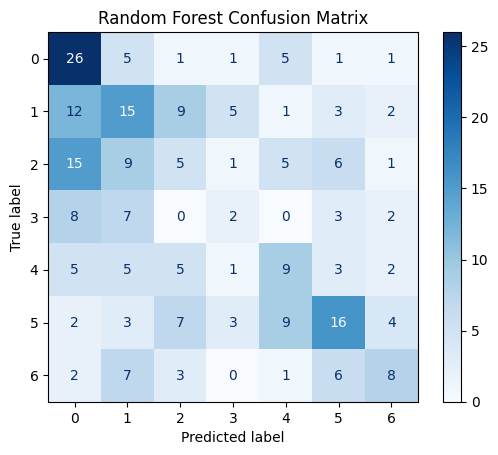

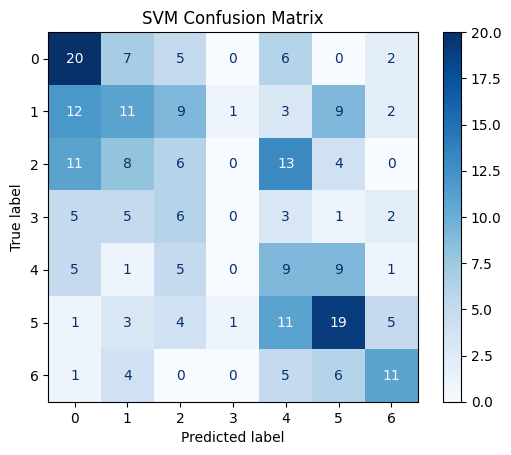

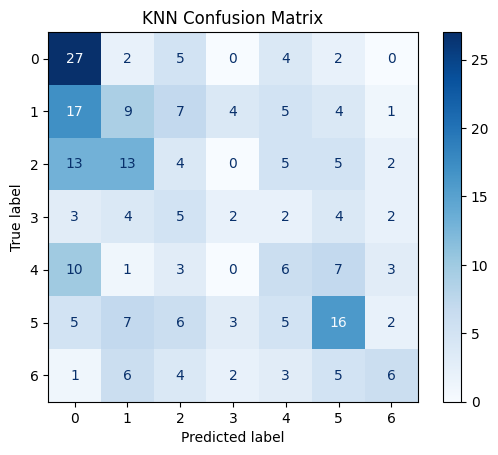

In [18]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")